In [ ]:
import os
import glob

dataset_path = "/kaggle/input/datasets/omarfkihhassen/baronsmarket/Market"

categories = os.listdir(dataset_path)

print("Nombre de catégories :", len(categories))
print()

total_images = 0
total_labels = 0

for cat in categories:
    
    img_path = os.path.join(dataset_path, cat, "images")
    lbl_path = os.path.join(dataset_path, cat, "labels")
    
    images = glob.glob(img_path + "/*.jpg")
    labels = glob.glob(lbl_path + "/*.txt")
    
    print(cat)
    print("images :", len(images))
    print("labels :", len(labels))
    print()
    
    total_images += len(images)
    total_labels += len(labels)

print("TOTAL IMAGES :", total_images)
print("TOTAL LABELS :", total_labels)

In [ ]:
import cv2
import random
import matplotlib.pyplot as plt
import os

dataset_path = "/kaggle/input/datasets/omarfkihhassen/baronsmarket/Market"

# collecter toutes les images
all_images = []

for cat in os.listdir(dataset_path):
    
    img_dir = os.path.join(dataset_path, cat, "images")
    
    for img in os.listdir(img_dir):
        if img.endswith(".jpg"):
            all_images.append(os.path.join(img_dir, img))


print("Total images trouvées :", len(all_images))


# choisir 5 images aléatoires
sample_images = random.sample(all_images, 5)

for img_path in sample_images:

    label_path = img_path.replace("images", "labels").replace(".jpg", ".txt")

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    h, w, _ = img.shape

    with open(label_path, "r") as f:
        line = f.readline().strip().split()

    class_id, cx, cy, bw, bh = map(float, line)

    # conversion YOLO → pixels
    x = int((cx - bw/2) * w)
    y = int((cy - bh/2) * h)
    bw = int(bw * w)
    bh = int(bh * h)

    cv2.rectangle(img, (x,y), (x+bw, y+bh), (255,0,0), 3)

    plt.figure(figsize=(5,5))
    plt.imshow(img)
    plt.title(os.path.basename(img_path))
    plt.axis("off")

In [ ]:
import os
import glob
import shutil
import random
from tqdm import tqdm

dataset_path = "/kaggle/input/datasets/omarfkihhassen/baronsmarket/Market"
output_path = "/kaggle/working/yolo_dataset"

# dossiers YOLO
train_img = os.path.join(output_path, "images/train")
val_img = os.path.join(output_path, "images/val")
train_lbl = os.path.join(output_path, "labels/train")
val_lbl = os.path.join(output_path, "labels/val")

os.makedirs(train_img, exist_ok=True)
os.makedirs(val_img, exist_ok=True)
os.makedirs(train_lbl, exist_ok=True)
os.makedirs(val_lbl, exist_ok=True)

# collecter toutes les images
all_images = []

for cat in os.listdir(dataset_path):
    
    img_dir = os.path.join(dataset_path, cat, "images")
    
    images = glob.glob(img_dir + "/*.jpg")
    
    all_images.extend(images)

print("Total images trouvées :", len(all_images))

# mélanger
random.shuffle(all_images)

# split 80/20
split = int(0.8 * len(all_images))

train_images = all_images[:split]
val_images = all_images[split:]

print("Train images :", len(train_images))
print("Val images :", len(val_images))


# copier train
print("\nCopie TRAIN...")
for img in tqdm(train_images):
    
    label = img.replace("images", "labels").replace(".jpg", ".txt")
    
    shutil.copy(img, train_img)
    shutil.copy(label, train_lbl)

# copier val
print("\nCopie VAL...")
for img in tqdm(val_images):
    
    label = img.replace("images", "labels").replace(".jpg", ".txt")
    
    shutil.copy(img, val_img)
    shutil.copy(label, val_lbl)

print("\nDataset YOLO prêt.")

In [ ]:
import yaml
import os

data_yaml = {
    
    "path": "/kaggle/working/yolo_dataset",
    
    "train": "images/train",
    "val": "images/val",
    
    "nc": 1,
    
    "names": ["product"]
}

yaml_path = "/kaggle/working/data.yaml"

with open(yaml_path, "w") as f:
    yaml.dump(data_yaml, f)

print("data.yaml créé")
print()

with open(yaml_path) as f:
    print(f.read())

In [2]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 24.5 MB/s eta 0:00:0000:01


In [ ]:
import os

label_dir = "/kaggle/working/yolo_dataset/labels"

for split in ["train", "val"]:

    path = os.path.join(label_dir, split)

    for file in os.listdir(path):

        if file.endswith(".txt"):

            full_path = os.path.join(path, file)

            with open(full_path) as f:
                lines = f.readlines()

            new_lines = []

            for line in lines:

                parts = line.split()

                if len(parts) == 5:

                    parts[0] = "0"   # forcer classe = 0

                    new_lines.append(" ".join(parts) + "\n")

            with open(full_path, "w") as f:
                f.writelines(new_lines)

print("Labels corrigés : toutes les classes = 0")

In [ ]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")

model.train(
    data="/kaggle/working/data.yaml",
    epochs=30,
    imgsz=640,
    batch=16,
    workers=2
)

In [ ]:
import os

model_path = "/kaggle/working/runs/detect/train2/weights"

print("Contenu du dossier :")
print(os.listdir(model_path))

In [ ]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# charger modèle entraîné
model = YOLO("/kaggle/working/runs/detect/train2/weights/best.pt")

# choisir une image du dataset
image_path = "/kaggle/input/datasets/omarfkihhassen/baronsmarket/Market/output_epicerie/images/product_146364.jpg"

# prédiction
results = model(image_path)

# afficher résultat
img = results[0].plot()

plt.figure(figsize=(6,6))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis("off")

In [ ]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

model = YOLO("/kaggle/working/runs/detect/train2/weights/best.pt")

image_path = "/kaggle/input/datasets/omarfkihhassen/baronsmarket/Market/output_epicerie/images/product_146364.jpg"

results = model(image_path)

img = cv2.imread(image_path)

for box in results[0].boxes.xyxy:

    x1,y1,x2,y2 = map(int, box)

    crop = img[y1:y2, x1:x2]

    plt.figure(figsize=(5,5))
    plt.imshow(cv2.cvtColor(crop, cv2.COLOR_BGR2RGB))
    plt.title("Produit crop")
    plt.axis("off")

In [3]:
!pip install git+https://github.com/openai/CLIP.git

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-ysotkm_d
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-ysotkm_d
  Resolved https://github.com/openai/CLIP.git to commit d05afc436d78f1c48dc0dbf8e5980a9d471f35f6
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.5 MB/s eta 0:00:00
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369490 sha256=ffa73045a587c2da3158a3745df89b1253789ba6abab12400afd3102d1910eaa
  Stored in directory: /tmp/pip-ephem-wheel-cache-tjzm2td5/wheels/35/3e/df/3d24cbfb3b6a06f17a2bfd7d1138900d4365d9028aa8f6e92f
Successfully built clip


In [ ]:
import torch
import clip
from PIL import Image

device = "cuda" if torch.cuda.is_available() else "cpu"

model, preprocess = clip.load("ViT-B/32", device=device)

print("CLIP chargé sur :", device)

In [ ]:
import os
import torch
import clip
import numpy as np
from PIL import Image
from tqdm import tqdm

dataset_path = "/kaggle/input/datasets/omarfkihhassen/baronsmarket/Market"

device = "cuda" if torch.cuda.is_available() else "cpu"

model, preprocess = clip.load("ViT-B/32", device=device)

image_paths = []

for cat in os.listdir(dataset_path):
    img_dir = os.path.join(dataset_path, cat, "images")
    
    for img in os.listdir(img_dir):
        if img.endswith(".jpg"):
            image_paths.append(os.path.join(img_dir, img))

print("Nombre total d'images :", len(image_paths))

embeddings = []
image_ids = []

for path in tqdm(image_paths):
    
    image = preprocess(Image.open(path)).unsqueeze(0).to(device)
    
    with torch.no_grad():
        feature = model.encode_image(image)
    
    feature = feature / feature.norm(dim=-1, keepdim=True)
    
    embeddings.append(feature.cpu().numpy())
    image_ids.append(path)

embeddings = np.vstack(embeddings)

print("Shape embeddings :", embeddings.shape)

np.save("/kaggle/working/product_embeddings.npy", embeddings)

with open("/kaggle/working/image_paths.txt","w") as f:
    for p in image_ids:
        f.write(p+"\n")

print("Embeddings sauvegardés")

In [ ]:
import numpy as np

embeddings = np.load("/kaggle/working/product_embeddings.npy")

with open("/kaggle/working/image_paths.txt") as f:
    image_paths = f.read().splitlines()

print("Embeddings chargés :", embeddings.shape)
print("Produits :", len(image_paths))

In [ ]:
import torch
import clip
from PIL import Image
import numpy as np

device = "cuda"

model, preprocess = clip.load("ViT-B/32", device=device)

test_image = "/kaggle/input/datasets/omarfkihhassen/baronsmarket/Market/output_epicerie/images/product_146364.jpg"

image = preprocess(Image.open(test_image)).unsqueeze(0).to(device)

with torch.no_grad():
    query = model.encode_image(image)

query = query / query.norm(dim=-1, keepdim=True)

query = query.cpu().numpy()

# cosine similarity
similarities = embeddings @ query.T

best_idx = np.argmax(similarities)

print("Produit le plus similaire :")
print(image_paths[best_idx])
print("Score :", similarities[best_idx][0])

In [ ]:
import json
import os

metadata = {}

dataset_path = "/kaggle/input/datasets/omarfkihhassen/baronsmarket/Market"

for cat in os.listdir(dataset_path):

    json_path = os.path.join(dataset_path, cat, "products_metadata.json")

    if os.path.exists(json_path):

        with open(json_path) as f:
            data = json.load(f)

            for product in data:
                metadata[product["product_id"]] = product

print("Produits metadata :", len(metadata))

In [ ]:
import re

path = image_paths[best_idx]

product_id = re.findall(r'product_(\d+)', path)[0]

print("Product ID :", product_id)

if product_id in metadata:
    print("Metadata trouvé")
else:
    print("Metadata manquant")

In [4]:
!pip install faiss-cpu

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.8/23.8 MB 69.1 MB/s eta 0:00:00:00:0100:01


In [ ]:
import faiss
import numpy as np

# charger embeddings
embeddings = np.load("/kaggle/working/product_embeddings.npy")

print("Shape embeddings :", embeddings.shape)

# dimension vecteurs
dimension = embeddings.shape[1]

# créer index FAISS
index = faiss.IndexFlatIP(dimension)

# ajouter embeddings
index.add(embeddings)

print("Nombre de vecteurs dans index :", index.ntotal)

In [ ]:
import torch
import clip
from PIL import Image
import numpy as np

device = "cuda"

model, preprocess = clip.load("ViT-B/32", device=device)

# image test
test_image = "/kaggle/input/datasets/omarfkihhassen/baronsmarket/Market/output_epicerie/images/product_146364.jpg"

image = preprocess(Image.open(test_image)).unsqueeze(0).to(device)

with torch.no_grad():
    query = model.encode_image(image)

query = query / query.norm(dim=-1, keepdim=True)
query = query.cpu().numpy()

# recherche FAISS
k = 5
distances, indices = index.search(query, k)

print("TOP produits similaires :\n")

for i in range(k):
    idx = indices[0][i]
    score = distances[0][i]
    
    print(i+1, image_paths[idx], "score:", score)

In [ ]:
import torchvision.transforms as T

augmentations = T.Compose([
    T.RandomHorizontalFlip(p=1),
])

print("Augmentation CLIP prête")

In [ ]:
import torch
import clip
import torchvision.transforms as T
from PIL import Image
import numpy as np

device = "cuda"

model, preprocess = clip.load("ViT-B/32", device=device)

# image test
image_path = "/kaggle/input/datasets/omarfkihhassen/baronsmarket/Market/output_epicerie/images/product_146364.jpg"

# augmentations
augmentations = [
    lambda x: x,  # original
    T.RandomHorizontalFlip(p=1),
    T.RandomRotation(10),
    T.ColorJitter(brightness=0.2, contrast=0.2),
]

embeddings_aug = []

image = Image.open(image_path)

for aug in augmentations:
    
    img_aug = aug(image)
    
    img = preprocess(img_aug).unsqueeze(0).to(device)

    with torch.no_grad():
        emb = model.encode_image(img)

    emb = emb / emb.norm(dim=-1, keepdim=True)
    
    embeddings_aug.append(emb.cpu().numpy())

embeddings_aug = np.vstack(embeddings_aug)

print("Nombre embeddings générés :", embeddings_aug.shape[0])
print("Dimension embeddings :", embeddings_aug.shape[1])

In [ ]:
import torch
import clip
import numpy as np
from PIL import Image
import torchvision.transforms as T
from tqdm import tqdm

device = "cuda"

model, preprocess = clip.load("ViT-B/32", device=device)

# augmentations
augmentations = [
    lambda x: x,
    T.RandomHorizontalFlip(p=1),
    T.RandomRotation(10),
    T.ColorJitter(brightness=0.2, contrast=0.2)
]

all_embeddings = []
all_paths = []

print("Création embeddings augmentés...")

for path in tqdm(image_paths):

    image = Image.open(path)

    for aug in augmentations:

        img_aug = aug(image)

        img = preprocess(img_aug).unsqueeze(0).to(device)

        with torch.no_grad():
            emb = model.encode_image(img)

        emb = emb / emb.norm(dim=-1, keepdim=True)

        all_embeddings.append(emb.cpu().numpy())
        all_paths.append(path)

all_embeddings = np.vstack(all_embeddings)

print("Shape embeddings augmentés :", all_embeddings.shape)

np.save("/kaggle/working/product_embeddings_aug.npy", all_embeddings)

with open("/kaggle/working/image_paths_aug.txt","w") as f:
    for p in all_paths:
        f.write(p+"\n")

print("Embeddings augmentés sauvegardés")

In [ ]:
import faiss
import numpy as np

embeddings_aug = np.load("/kaggle/working/product_embeddings_aug.npy")

print("Shape embeddings :", embeddings_aug.shape)

dimension = embeddings_aug.shape[1]

index = faiss.IndexFlatIP(dimension)

index.add(embeddings_aug)

print("Nombre de vecteurs dans index :", index.ntotal)

In [ ]:
import torch
import clip
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from ultralytics import YOLO
import re

device = "cuda"

# charger modèles
clip_model, preprocess = clip.load("ViT-B/32", device=device)
yolo_model = YOLO("/kaggle/working/runs/detect/train/weights/best.pt")

# charger embeddings FAISS
embeddings = np.load("/kaggle/working/product_embeddings_aug.npy")

# charger paths
with open("/kaggle/working/image_paths_aug.txt") as f:
    image_paths = f.read().splitlines()

# charger metadata
import json, os

metadata = {}

dataset_path = "/kaggle/input/datasets/omarfkihhassen/baronsmarket/Market"

for cat in os.listdir(dataset_path):
    
    json_path = os.path.join(dataset_path, cat, "products_metadata.json")
    
    if os.path.exists(json_path):
        
        with open(json_path) as f:
            data = json.load(f)

            for product in data:
                metadata[product["product_id"]] = product


# IMAGE TEST (tu peux changer ici)
image_test = "/kaggle/input/datasets/omarfkihhassen/testttzez/tlcharg (9).jpg"

# YOLO detection
results = yolo_model(image_test)

img = cv2.imread(image_test)

for box in results[0].boxes.xyxy:

    x1,y1,x2,y2 = map(int, box)

    crop = img[y1:y2, x1:x2]

    crop_rgb = cv2.cvtColor(crop, cv2.COLOR_BGR2RGB)

    plt.imshow(crop_rgb)
    plt.axis("off")
    plt.show()

    pil_img = Image.fromarray(crop_rgb)

    image = preprocess(pil_img).unsqueeze(0).to(device)

    with torch.no_grad():
        emb = clip_model.encode_image(image)

    emb = emb / emb.norm(dim=-1, keepdim=True)

    query = emb.cpu().numpy()

    # similarity
    sims = embeddings @ query.T

    best_idx = np.argmax(sims)

    best_path = image_paths[best_idx]

    product_id = re.findall(r'product_(\d+)', best_path)[0]

    info = metadata[product_id]

    print("\nProduit reconnu :")
    print("Nom :", info["name"])
    print("Marque :", info["brand"])
    print("Prix :", info["price"])
    print("Categorie :", info["class_name"])

In [ ]:
import faiss

faiss.write_index(index, "/kaggle/working/faiss_index.bin")

print("Index FAISS sauvegardé")

In [ ]:
import zipfile
import os

files_to_save = [
    "/kaggle/working/product_embeddings_aug.npy",
    "/kaggle/working/image_paths_aug.txt",
    "/kaggle/working/faiss_index.bin",
    "/kaggle/working/runs/detect/train2/weights/best.pt",
    "/kaggle/working/runs/detect/train2/results.csv",
    "/kaggle/working/runs/detect/train2/BoxF1_curve.png",
    "/kaggle/working/runs/detect/train2/BoxPR_curve.png",
    "/kaggle/working/runs/detect/train2/BoxP_curve.png",
    "/kaggle/working/runs/detect/train2/BoxR_curve.png",
    "/kaggle/working/runs/detect/train2/confusion_matrix_normalized.png",
    "/kaggle/working/runs/detect/train2/confusion_matrix.png",
    "/kaggle/working/runs/detect/train2/results.png"
]

zip_path = "/kaggle/working/baronsmarket_system.zip"

with zipfile.ZipFile(zip_path, 'w') as zipf:
    for file in files_to_save:
        if os.path.exists(file):
            zipf.write(file, os.path.basename(file))

print("ZIP créé :", zip_path)

# BaronsMarket Vision

Pipeline de reconnaissance produit basé sur :

YOLOv8 + CLIP + FAISS

Architecture :

IMAGE
↓
YOLO detection
↓
Product crop
↓
CLIP embedding
↓
FAISS similarity search
↓
Product metadata

In [5]:
!pip install ultralytics
!pip install torch
!pip install torchvision
!pip install faiss-cpu
!pip install git+https://github.com/openai/CLIP.git
!pip install opencv-python
!pip install pillow
!pip install matplotlib

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-9aogpqpx
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-9aogpqpx
  Resolved https://github.com/openai/CLIP.git to commit d05afc436d78f1c48dc0dbf8e5980a9d471f35f6
  Preparing metadata (setup.py) ... done


In [16]:
import torch
import clip
import faiss
import numpy as np
import cv2
from ultralytics import YOLO
from PIL import Image

# Visualisation


In [ ]:
import numpy as np

embeddings = np.load("/kaggle/input/datasets/omarfkihhassen/yolore/product_embeddings_aug.npy")

print("Shape embeddings :", embeddings.shape)

In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# prendre un sous ensemble pour la visualisation
sample = embeddings[:3000]

# PCA vers 2 dimensions
pca = PCA(n_components=2)

X = pca.fit_transform(sample)

print("Shape PCA :", X.shape)

plt.figure(figsize=(8,8))

plt.scatter(
    X[:,0],
    X[:,1],
    s=6,
    alpha=0.7
)

plt.title("Projection PCA des embeddings produits")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")

plt.show()

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

# prendre un sous ensemble
sample = embeddings[:2000]

print("Calcul t-SNE...")

tsne = TSNE(
    n_components=2,
    perplexity=30,
    random_state=42
)

X = tsne.fit_transform(sample)

print("Shape t-SNE :", X.shape)

plt.figure(figsize=(8,8))

plt.scatter(
    X[:,0],
    X[:,1],
    s=6,
    alpha=0.7
)

plt.title("t-SNE des embeddings produits")

plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import random

# charger embeddings
embeddings = np.load("/kaggle/input/datasets/omarfkihhassen/yolore/product_embeddings_aug.npy")

# charger chemins images
with open("/kaggle/input/datasets/omarfkihhassen/yolore/image_paths_aug.txt") as f:
    image_paths = f.read().splitlines()

# sélectionner un échantillon aléatoire
n = 2000
indices = random.sample(range(len(embeddings)), n)

sample_embeddings = embeddings[indices]
sample_paths = [image_paths[i] for i in indices]

# récupérer catégories
categories = [p.split("/")[-3] for p in sample_paths]

unique_categories = list(set(categories))
print("Nombre catégories :", len(unique_categories))

# encoder catégories en couleurs
color_map = {c:i for i,c in enumerate(unique_categories)}
colors = [color_map[c] for c in categories]

# t-SNE
print("Calcul t-SNE...")

tsne = TSNE(
    n_components=2,
    perplexity=30,
    random_state=42
)

X = tsne.fit_transform(sample_embeddings)

print("Shape t-SNE :", X.shape)

plt.figure(figsize=(10,10))

plt.scatter(
    X[:,0],
    X[:,1],
    c=colors,
    cmap="tab20",
    s=8
)

plt.title("t-SNE des embeddings produits colorés par catégorie")

plt.show()

In [ ]:
!pip install plotly

In [ ]:
import json
import os

metadata = {}

dataset_path = "/kaggle/input/datasets/omarfkihhassen/baronsmarket/Market"

for cat in os.listdir(dataset_path):

    json_path = os.path.join(dataset_path, cat, "products_metadata.json")

    if os.path.exists(json_path):

        with open(json_path) as f:
            data = json.load(f)

            for product in data:
                metadata[product["product_id"]] = product

print("Produits metadata :", len(metadata))

In [ ]:
from sklearn.decomposition import PCA
import plotly.express as px
import numpy as np

# charger embeddings
embeddings = np.load("/kaggle/input/datasets/omarfkihhassen/finalen/product_embeddings_aug.npy")

# charger chemins images
with open("/kaggle/input/datasets/omarfkihhassen/yolore/image_paths_aug.txt") as f:
    image_paths = f.read().splitlines()

# échantillon aléatoire
import random
n = 2000
indices = random.sample(range(len(embeddings)), n)

sample_embeddings = embeddings[indices]
sample_paths = [image_paths[i] for i in indices]

# catégories
categories = [p.split("/")[-3] for p in sample_paths]

# PCA 3D
pca = PCA(n_components=3)
X = pca.fit_transform(sample_embeddings)

print("Shape PCA 3D :", X.shape)

In [ ]:
import plotly.io as pio
pio.renderers.default = "iframe"

In [ ]:
hover_text = []

for p in sample_paths:

    filename = os.path.basename(p)
    product_id = filename.split("_")[1].split(".")[0]

    if product_id in metadata:

        d = metadata[product_id]

        text = (
            f"Nom: {d['name']}<br>"
            f"Marque: {d['brand']}<br>"
            f"Prix: {d['price']}<br>"
            f"Catégorie: {d['class_name']}"
        )

    else:
        text = "metadata manquante"

    hover_text.append(text)

In [ ]:
import plotly.express as px

fig = px.scatter_3d(
    x=X[:,0],
    y=X[:,1],
    z=X[:,2],
    color=categories,
    hover_name=hover_text,
    title="Visualisation 3D des produits"
)

fig.update_traces(marker=dict(size=3))

fig.show()

In [ ]:
from PIL import Image
from IPython.display import display

display(Image.open("/kaggle/input/datasets/omarfkihhassen/finalen/results.png"))

In [ ]:
display(Image.open("/kaggle/input/datasets/omarfkihhassen/finalen/BoxPR_curve.png"))

In [ ]:
display(Image.open("/kaggle/input/datasets/omarfkihhassen/finalen/BoxP_curve.png"))

In [ ]:
display(Image.open("/kaggle/input/datasets/omarfkihhassen/finalen/BoxR_curve.png"))

In [ ]:
display(Image.open("/kaggle/input/datasets/omarfkihhassen/finalen/BoxF1_curve.png"))

In [ ]:
display(Image.open("/kaggle/input/datasets/omarfkihhassen/finalen/confusion_matrix.png"))

In [ ]:
display(Image.open("/kaggle/working/runs/detect/train2/labels.jpg"))

In [ ]:
import pandas as pd

df = pd.read_csv("/kaggle/input/datasets/omarfkihhassen/finalen/results.csv")
df.tail()

In [ ]:
import numpy as np
import faiss

# charger embeddings
embeddings = np.load("/kaggle/input/datasets/omarfkihhassen/finalen/product_embeddings_aug.npy")

print("Shape embeddings :", embeddings.shape)

# dimension
dim = embeddings.shape[1]

# créer index FAISS
index = faiss.IndexFlatIP(dim)

# ajouter embeddings
index.add(embeddings)

print("Vecteurs dans FAISS :", index.ntotal)

In [ ]:
import torch
import clip
from PIL import Image

# choisir device
device = "cuda" if torch.cuda.is_available() else "cpu"

# charger CLIP
clip_model, preprocess = clip.load("ViT-B/32", device=device)

print("CLIP chargé sur :", device)

In [ ]:
# charger chemins images
with open("/kaggle/input/datasets/omarfkihhassen/finalen/image_paths_aug.txt", "r") as f:
    image_paths = [line.strip() for line in f]

print("Nombre chemins images :", len(image_paths))
print("Exemple :", image_paths[0])

In [ ]:
import cv2
import numpy as np

# image test
image_path = "/kaggle/input/datasets/omarfkihhassen/testirl/IMG_20260314_191157.jpg"

# lire image
img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# convertir en PIL
pil_img = Image.fromarray(img)

# preprocess CLIP
image_input = preprocess(pil_img).unsqueeze(0).to(device)

# calcul embedding
with torch.no_grad():
    embedding = clip_model.encode_image(image_input)

embedding = embedding.cpu().numpy()
embedding = embedding / np.linalg.norm(embedding)

print("Embedding shape :", embedding.shape)

In [ ]:
# recherche dans FAISS
D, I = index.search(embedding, 5)

print("Indices des produits :", I)
print("Scores similarité :", D)

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(15,5))

for i, idx in enumerate(I[0]):

    product_path = image_paths[idx]

    img = cv2.imread(product_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(1,5,i+1)
    plt.imshow(img)
    plt.title(f"Score {D[0][i]:.3f}")
    plt.axis("off")

plt.show()

In [ ]:
import os

plt.figure(figsize=(15,5))

for i, idx in enumerate(I[0]):

    product_path = image_paths[idx]

    # extraire product_id
    filename = os.path.basename(product_path)
    product_id = filename.split("_")[1].split(".")[0]

    # charger metadata
    if product_id in metadata:
        data = metadata[product_id]

        name = data["name"]
        brand = data["brand"]
        price = data["price"]
        category = data["class_name"]

        title = f"{brand}\n{name}\n{price}"

    else:
        title = "Metadata non trouvé"

    img = cv2.imread(product_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(1,5,i+1)
    plt.imshow(img)
    plt.title(title)
    plt.axis("off")

plt.show()

In [ ]:
import numpy as np
from sklearn.decomposition import PCA

# réduire dimension embeddings
sample = embeddings[:3000]

pca = PCA(n_components=3)

pca_result = pca.fit_transform(sample)

print("Shape PCA :", pca_result.shape)

In [ ]:
import plotly.express as px
import pandas as pd
import os

names = []
brands = []
prices = []
images = []

for path in image_paths[:3000]:

    filename = os.path.basename(path)
    product_id = filename.split("_")[1].split(".")[0]

    if product_id in metadata:

        data = metadata[product_id]

        names.append(data["name"])
        brands.append(data["brand"])
        prices.append(data["price"])

    else:

        names.append("unknown")
        brands.append("unknown")
        prices.append("unknown")

    images.append(path)

df = pd.DataFrame({
    "x": pca_result[:,0],
    "y": pca_result[:,1],
    "z": pca_result[:,2],
    "name": names,
    "brand": brands,
    "price": prices,
    "image": images
})

fig = px.scatter_3d(
    df,
    x="x",
    y="y",
    z="z",
    color="brand",
    hover_data=["name","price","image"]
)

fig.show()

In [ ]:
import base64

def image_to_base64(path):
    
    try:
        with open(path, "rb") as f:
            img_bytes = f.read()
            encoded = base64.b64encode(img_bytes).decode()
            return f"data:image/jpeg;base64,{encoded}"
    except:
        return None

df["img64"] = df["image"].apply(image_to_base64)

print("Images encodées :", df["img64"].notnull().sum())

In [ ]:
import plotly.express as px

df_hover = df.copy()

df_hover["info"] = (
    "Brand: " + df_hover["brand"] +
    "<br>Name: " + df_hover["name"] +
    "<br>Price: " + df_hover["price"]
)

fig = px.scatter_3d(
    df_hover,
    x="x",
    y="y",
    z="z",
    color="brand",
    hover_data={
        "x": False,
        "y": False,
        "z": False,
        "brand": True,
        "name": True,
        "price": True,
        "image": False
    }
)

fig.update_layout(
    title="3D Product Embedding Map (CLIP)",
    width=900,
    height=700
)

fig.show()

In [ ]:
import umap
import numpy as np

print("Shape original embeddings :", embeddings.shape)

# UMAP projection
reducer = umap.UMAP(
    n_neighbors=30,
    min_dist=0.1,
    n_components=2,
    metric="cosine",
    random_state=42
)

embedding_umap = reducer.fit_transform(embeddings)

print("Shape UMAP :", embedding_umap.shape)

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,10))

plt.scatter(
    embedding_umap[:,0],
    embedding_umap[:,1],
    s=1,
    alpha=0.5
)

plt.title("UMAP Map of All Products (85k embeddings)")
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")

plt.show()

In [ ]:
import os

categories = []

for path in image_paths:

    # catégorie = dossier parent
    cat = path.split("/")[-3]

    categories.append(cat)

print("Nombre categories :", len(set(categories)))
print(list(set(categories))[:10])

In [ ]:
import umap

# UMAP 3D
reducer3d = umap.UMAP(
    n_neighbors=30,
    min_dist=0.1,
    n_components=3,
    metric="cosine",
    random_state=42
)

embedding_umap3d = reducer3d.fit_transform(embeddings)

print("Shape UMAP 3D :", embedding_umap3d.shape)

In [ ]:
import plotly.express as px
import pandas as pd
import numpy as np

# échantillon pour fluidité
sample_size = 20000
indices = np.random.choice(len(embedding_umap3d), sample_size, replace=False)

df_vis = pd.DataFrame({
    "x": embedding_umap3d[indices,0],
    "y": embedding_umap3d[indices,1],
    "z": embedding_umap3d[indices,2],
    "category": np.array(categories)[indices]
})

fig = px.scatter_3d(
    df_vis,
    x="x",
    y="y",
    z="z",
    color="category",
    opacity=0.7,
)

fig.update_layout(
    title="3D Product Embedding Map (Categories)",
    width=1000,
    height=800
)

fig.show()

#  Vision

In [ ]:
# YOLO
yolo_model = YOLO("/kaggle/input/datasets/omarfkihhassen/finalen/best.pt")

# CLIP
device = "cuda" if torch.cuda.is_available() else "cpu"
clip_model, preprocess = clip.load("ViT-B/32", device=device)

print("CLIP chargé sur :", device)

In [ ]:
embeddings = np.load("/kaggle/input/datasets/omarfkihhassen/finalen/product_embeddings_aug.npy")

with open("/kaggle/input/datasets/omarfkihhassen/finalen/image_paths_aug.txt") as f:
    image_paths = f.read().splitlines()

print("Embeddings chargés :", embeddings.shape)

In [ ]:
dimension = embeddings.shape[1]

index = faiss.IndexFlatIP(dimension)
index.add(embeddings)

print("Index FAISS prêt :", index.ntotal)

In [ ]:
import json
import os

metadata = {}

dataset_path = "/kaggle/input/datasets/omarfkihhassen/baronsmarket/Market"

for cat in os.listdir(dataset_path):

    json_path = os.path.join(dataset_path, cat, "products_metadata.json")

    if os.path.exists(json_path):

        with open(json_path) as f:
            data = json.load(f)

            for product in data:
                metadata[product["product_id"]] = product

print("Produits metadata :", len(metadata))

In [ ]:
import os
import cv2
import numpy as np
import torch
from PIL import Image
import matplotlib.pyplot as plt

def recognize_product(image_path):

    # Détection produit avec YOLO
    results = yolo_model(image_path)

    boxes = results[0].boxes.xyxy.cpu().numpy()

    if len(boxes) == 0:
        print("Aucun produit détecté")
        return

    # prendre le premier produit détecté
    x1, y1, x2, y2 = map(int, boxes[0])

    # lire image
    img = cv2.imread(image_path)

    # crop produit
    crop = img[y1:y2, x1:x2]

    # convertir pour CLIP
    crop_rgb = cv2.cvtColor(crop, cv2.COLOR_BGR2RGB)
    pil_img = Image.fromarray(crop_rgb)

    # preprocessing CLIP
    image_input = preprocess(pil_img).unsqueeze(0).to(device)

    # calcul embedding
    with torch.no_grad():
        embedding = clip_model.encode_image(image_input)

    embedding = embedding.cpu().numpy()

    # normalisation
    embedding = embedding / np.linalg.norm(embedding, axis=1, keepdims=True)

    # recherche FAISS
    D, I = index.search(embedding, 5)

    best = I[0][0]
    best_path = image_paths[best]

    print("Produit reconnu :", best_path)

    # extraire product_id
    filename = os.path.basename(best_path)
    product_id = filename.split("_")[1].split(".")[0]

    # afficher metadata
    if product_id in metadata:

        data = metadata[product_id]

        print("\nProduit reconnu :")
        print("Nom :", data["name"])
        print("Marque :", data["brand"])
        print("Prix :", data["price"])
        print("Categorie :", data["class_name"])

    else:
        print("Metadata non trouvé pour ce produit")

    # afficher image produit trouvé
    img_result = cv2.imread(best_path)
    img_result = cv2.cvtColor(img_result, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(4,6))
    plt.imshow(img_result)
    plt.title("Produit trouvé")
    plt.axis("off")
    plt.show()

In [ ]:
recognize_product("/kaggle/input/datasets/omarfkihhassen/testirl/IMG_20260314_191157.jpg")

In [6]:
pip install grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 80.0 MB/s eta 0:00:00:00:010:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.5.5-py3-none-any.whl size=44286 sha256=422362bfbbc34df48b46d0a7da6e3271afbad8952a90b3d14c1459392bcdfa58
  Stored in directory: /root/.cache/pip/wheels/fb/3b/09/2afc520f3d69bc26ae6bd87416759c820a3f7d05c1a077bbf6
Successfully built grad-cam
Note: you may need to restart the kernel to use updated packages.


In [7]:
!pip install ultralytics==8.3.0
!pip install grad-cam opencv-python matplotlib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 4.4 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of opencv-python to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 881.3/881.3 kB 30.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 94.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.0/63.0 MB 31.6 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
  Attempting uninstall: opencv-python
    Found existing installation: opencv-python 4.12.0.88
    Uninstalling opencv-python-4.12.0.88:
      Successfully uninstalled opencv-python-4.12.0.88
  Attempting uninstall: ultralytics
    Found existing installation: ultralytics 8.4.41
    Uninstalling ultralytics-8.4.41:
      Successfully uninstalled ultralytics-8

In [8]:
!pip install numpy==2.0.2 --force-reinstall
!pip install ultralytics --upgrade --force-reinstall

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.9/60.9 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.2/19.2 MB 81.1 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 2.31.0 requires google-cloud-bigquery-storage<3.0.0,>=2.30.0, which is not installed.
ultralytics 8.3.0 requires numpy<2.0.0,>=1.23.0, but you have numpy 2.0.2 which is incompatible.
google-colab 1.0.0 requires jupyter-server==2.14.0, but you have jupyter-server 2.12.5 which is incompatible.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 2.3.3 which is incompatible.
dopamine-rl 4.1.2 requires gym<=0.25.2, but you have gym 0.26.2 which is incompatible.
  Using cached ultraly

In [1]:
from ultralytics import YOLO

# charger ton modèle
model = YOLO("/kaggle/input/datasets/omarfkihhassen/finalen/best.pt")

print("✅ Model loaded successfully")

✅ Model loaded successfully



image 1/1 /kaggle/input/datasets/omarfkihhassen/testttzez/tlcharg (9).jpg: 640x480 1 product, 39.3ms
Speed: 6.7ms preprocess, 39.3ms inference, 251.9ms postprocess per image at shape (1, 3, 640, 480)


(np.float64(-0.5), np.float64(189.5), np.float64(264.5), np.float64(-0.5))

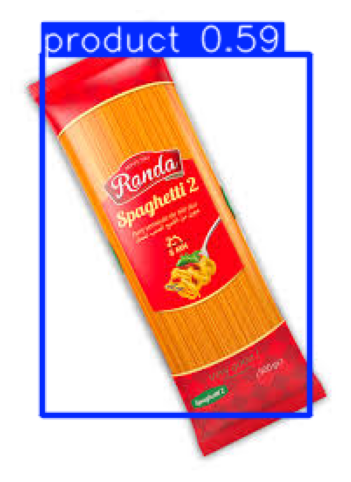

In [2]:
import cv2
import matplotlib.pyplot as plt

# chemin image (adapte si besoin)
img_path = "/kaggle/input/datasets/omarfkihhassen/testttzez/tlcharg (9).jpg"

# prédiction
results = model(img_path)

# récupérer image annotée
res = results[0].plot()

# afficher proprement
plt.figure(figsize=(6,6))
plt.imshow(cv2.cvtColor(res, cv2.COLOR_BGR2RGB))
plt.axis("off")

(np.float64(-0.5), np.float64(189.5), np.float64(264.5), np.float64(-0.5))

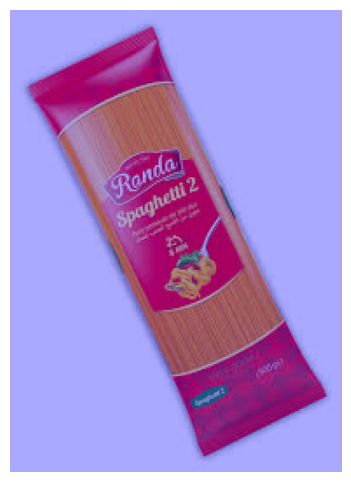

In [10]:
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image

# ----------------------------
# image
# ----------------------------
img = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_norm = img_rgb / 255.0

input_tensor = torch.tensor(img_norm).permute(2,0,1).unsqueeze(0).float()
input_tensor.requires_grad = True

# ----------------------------
# backbone YOLO
# ----------------------------
backbone = torch.nn.Sequential(*model.model.model[:10])

# ----------------------------
# target custom 🔥🔥🔥
# ----------------------------
class YOLOTarget:
    def __call__(self, model_output):
        return model_output.mean()  # transforme en scalaire

targets = [YOLOTarget()]

# ----------------------------
# Grad-CAM
# ----------------------------
cam = GradCAM(model=backbone, target_layers=[backbone[-1]])

grayscale_cam = cam(input_tensor=input_tensor, targets=targets)

# ----------------------------
# overlay
# ----------------------------
visualization = show_cam_on_image(img_norm, grayscale_cam[0], use_rgb=True)

# ----------------------------
# display
# ----------------------------
plt.figure(figsize=(6,6))
plt.imshow(visualization)
plt.axis("off")

(np.float64(-0.5), np.float64(152.5), np.float64(206.5), np.float64(-0.5))

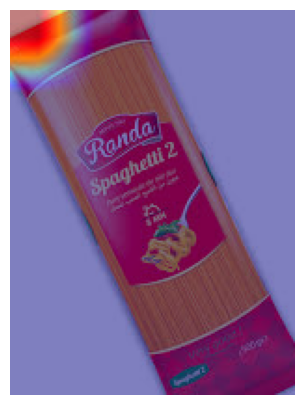

In [11]:
# ----------------------------
# récupérer bbox
# ----------------------------
boxes = results[0].boxes.xyxy.cpu().numpy()

x1, y1, x2, y2 = boxes[0].astype(int)

# ----------------------------
# crop produit
# ----------------------------
crop = img[y1:y2, x1:x2]

crop_rgb = cv2.cvtColor(crop, cv2.COLOR_BGR2RGB)
crop_norm = crop_rgb / 255.0

input_tensor_crop = torch.tensor(crop_norm).permute(2,0,1).unsqueeze(0).float()
input_tensor_crop.requires_grad = True

# ----------------------------
# Grad-CAM sur crop
# ----------------------------
grayscale_cam = cam(input_tensor=input_tensor_crop, targets=targets)

visualization = show_cam_on_image(crop_norm, grayscale_cam[0], use_rgb=True)

# ----------------------------
# afficher
# ----------------------------
plt.figure(figsize=(5,5))
plt.imshow(visualization)
plt.axis("off")

In [18]:
import numpy as np

# charger embeddings
product_embeddings_aug = np.load("/kaggle/input/datasets/omarfkihhassen/finalen/product_embeddings_aug.npy")

print("Shape:", product_embeddings_aug.shape)

Shape: (85348, 512)


In [20]:
# convertir en tensor
embeddings_tensor = torch.tensor(product_embeddings_aug).to(device)

# similarité
similarities = image_features @ embeddings_tensor.T

# top 5
top5 = similarities[0].topk(5)

print("Top 5 indices:", top5.indices)
print("Scores:", top5.values)

Top 5 indices: tensor([74691, 74688, 74690, 85033, 85035], device='cuda:0')
Scores: tensor([8.5703, 8.4688, 8.4141, 8.2891, 8.2031], device='cuda:0', dtype=torch.float16)


In [22]:
# charger les chemins des images
with open("/kaggle/input/datasets/omarfkihhassen/finalen/image_paths_aug.txt", "r") as f:
    image_paths_aug = [line.strip() for line in f]

print("Nombre images:", len(image_paths_aug))

Nombre images: 85348


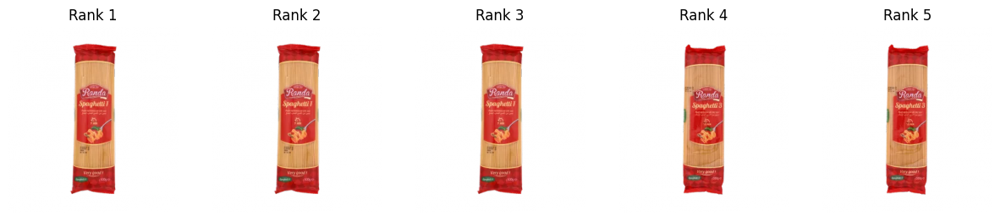

In [24]:
import matplotlib.pyplot as plt
from PIL import Image

top_indices = top5.indices.cpu().numpy()

plt.figure(figsize=(15,5))

for i, idx in enumerate(top_indices):
    img_path_sim = image_paths_aug[idx]
    
    img_sim = Image.open(img_path_sim)
    
    plt.subplot(1,5,i+1)
    plt.imshow(img_sim)
    plt.title(f"Rank {i+1}")
    plt.axis("off")

plt.show()

In [25]:
!pip install umap-learn plotly

In [26]:
import umap
import numpy as np

# embeddings (tu les as déjà)
X = product_embeddings_aug

# réduire en 3D
reducer = umap.UMAP(n_components=3, random_state=42)
X_umap = reducer.fit_transform(X)

print("Shape UMAP:", X_umap.shape)

E0000 00:00:1775463713.576214     228 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1775463713.627805     228 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1775463714.012074     228 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1775463714.012103     228 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1775463714.012106     228 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1775463714.012108     228 computation_placer.cc:177] computation placer already registered. Please check linka

Shape UMAP: (85348, 3)


In [27]:
categories = []

for path in image_paths_aug:
    # exemple: /Market/output_boissons/images/xxx.jpg
    cat = path.split("/")[-3]  # output_boissons
    categories.append(cat)

# encoder catégories
unique_cats = list(set(categories))
cat_to_id = {c:i for i,c in enumerate(unique_cats)}

colors = [cat_to_id[c] for c in categories]

In [28]:
import plotly.express as px

fig = px.scatter_3d(
    x=X_umap[:,0],
    y=X_umap[:,1],
    z=X_umap[:,2],
    color=colors,
    hover_name=image_paths_aug,
    title="UMAP 3D - Produits"
)

fig.show()

In [9]:
import faiss
import numpy as np

embeddings = np.load("product_embeddings_aug.npy")

dim = embeddings.shape[1]

index = faiss.IndexFlatL2(dim)
index.add(embeddings)

faiss.write_index(index, "index.faiss")

FileNotFoundError: [Errno 2] No such file or directory: 'product_embeddings_aug.npy'